![Quora Question Pairs](quora-logo.png)

<h1 style="text-align:center;font-size:30px;" > Quora Question Pairs </h1>

<h1> 1. Business Problem </h1>

<h2> 1.1 Description </h2>

<p>Quora is a place to gain and share knowledge—about anything. It’s a platform to ask questions and connect with people who contribute unique insights and quality answers. This empowers people to learn from each other and to better understand the world.</p>
<p>
Over 100 million people visit Quora every month, so it's no surprise that many people ask similarly worded questions. Multiple questions with the same intent can cause seekers to spend more time finding the best answer to their question, and make writers feel they need to answer multiple versions of the same question. Quora values canonical questions because they provide a better experience to active seekers and writers, and offer more value to both of these groups in the long term.
</p>
<br>
> Credits: Kaggle 


__ Problem Statement __
- Identify which questions asked on Quora are duplicates of questions that have already been asked. 
- This could be useful to instantly provide answers to questions that have already been answered. 
- We are tasked with predicting whether a pair of questions are duplicates or not. 

<h2> 1.2 Sources/Useful Links</h2>

- Source : https://www.kaggle.com/c/quora-question-pairs
<br><br>____ Useful Links ____
- Discussions : https://www.kaggle.com/anokas/data-analysis-xgboost-starter-0-35460-lb/comments
- Kaggle Winning Solution and other approaches: https://www.dropbox.com/sh/93968nfnrzh8bp5/AACZdtsApc1QSTQc7X0H3QZ5a?dl=0
- Blog 1 : https://engineering.quora.com/Semantic-Question-Matching-with-Deep-Learning
- Blog 2 : https://towardsdatascience.com/identifying-duplicate-questions-on-quora-top-12-on-kaggle-4c1cf93f1c30

<h2>1.3 Real world/Business Objectives and Constraints </h2>

1. The cost of a mis-classification can be very high.
2. You would want a probability of a pair of questions to be duplicates so that you can choose any threshold of choice.
3. No strict latency concerns.
4. Interpretability is partially important.

<h1>2. Machine Learning Probelm </h1>

<h2> 2.1 Data </h2>

<h3> 2.1.1 Data Overview </h3>

<p> 
- Data will be in a file Train.csv <br>
- Train.csv contains 5 columns : qid1, qid2, question1, question2, is_duplicate <br>
- Size of Train.csv - 60MB <br>
- Number of rows in Train.csv = 404,290
</p>

<h3> 2.1.2 Example Data point </h3>

<pre>
"id","qid1","qid2","question1","question2","is_duplicate"
"0","1","2","What is the step by step guide to invest in share market in india?","What is the step by step guide to invest in share market?","0"
"1","3","4","What is the story of Kohinoor (Koh-i-Noor) Diamond?","What would happen if the Indian government stole the Kohinoor (Koh-i-Noor) diamond back?","0"
"7","15","16","How can I be a good geologist?","What should I do to be a great geologist?","1"
"11","23","24","How do I read and find my YouTube comments?","How can I see all my Youtube comments?","1"
</pre>

<h2> 2.2 Mapping the real world problem to an ML problem </h2>

<h3> 2.2.1 Type of Machine Leaning Problem </h3>

<p> It is a binary classification problem, for a given pair of questions we need to predict if they are duplicate or not. </p>

<h3> 2.2.2 Performance Metric </h3>

Source: https://www.kaggle.com/c/quora-question-pairs#evaluation

Metric(s): 
* Primary metric-Log-loss : This is because we just do not need the class label, we require the probability of the similiarity  https://www.kaggle.com/wiki/LogarithmicLoss
* Secondary metric-Binary Confusion Matrix : This gives an indication about the false positives & false negatives as they are very importatnt in this case study.

<h2> 2.3 Train and Test Construction </h2>

<p>  </p>
<p> We build train and test by randomly splitting in the ratio of 70:30 or 80:20 whatever we choose as we have sufficient points to work with. </p>

<h1>3. Exploratory Data Analysis and featurizations </h1>

### Importing all the modules

In [2]:
import warnings
warnings.filterwarnings("ignore")
import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer
import re
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle
from tqdm import tqdm
import os
from chart_studio.plotly import plotly
import plotly.graph_objs as go
#offline.init_notebook_mode()
from collections import Counter
from subprocess import check_output
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.tools as tls
import gc
import distance
from bs4 import BeautifulSoup

<h2> 3.1 Reading data and basic stats </h2>

In [3]:
df = pd.read_csv("train.csv")

print("Number of data points:",df.shape[0])

Number of data points: 404290


In [4]:
df.head()

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404290 entries, 0 to 404289
Data columns (total 6 columns):
id              404290 non-null int64
qid1            404290 non-null int64
qid2            404290 non-null int64
question1       404289 non-null object
question2       404288 non-null object
is_duplicate    404290 non-null int64
dtypes: int64(4), object(2)
memory usage: 18.5+ MB


We are given a minimal number of data fields here, consisting of:

- id:  Looks like a simple rowID
- qid{1, 2}:  The unique ID of each question in the pair
- question{1, 2}:  The actual textual contents of the questions.
- is_duplicate:  The label that we are trying to predict - whether the two questions are duplicates of each other.

<h3> 3.2.1 Distribution of data points among output classes</h3>
- Number of duplicate(smilar) and non-duplicate(non similar) questions

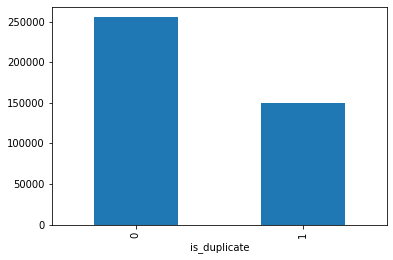

In [6]:
df.groupby("is_duplicate")['id'].count().plot.bar()

In [7]:
print('~> Total number of question pairs for training:\n   {}'.format(len(df)))

~> Total number of question pairs for training:
   404290


In [8]:
print('~> Question pairs are not Similar (is_duplicate = 0):\n   {}%'.format(100 - round(df['is_duplicate'].mean()*100, 2)))
print('\n~> Question pairs are Similar (is_duplicate = 1):\n   {}%'.format(round(df['is_duplicate'].mean()*100, 2)))

~> Question pairs are not Similar (is_duplicate = 0):
   63.08%

~> Question pairs are Similar (is_duplicate = 1):
   36.92%


<h3> 3.2.2 Number of unique questions </h3>

In [9]:
qids = pd.Series(df['qid1'].tolist() + df['qid2'].tolist())
unique_qs = len(np.unique(qids))
qs_morethan_onetime = np.sum(qids.value_counts() > 1)
print ('Total number of  Unique Questions are: {}\n'.format(unique_qs))
#print len(np.unique(qids))

print ('Number of unique questions that appear more than one time: {} ({}%)\n'.format(qs_morethan_onetime,qs_morethan_onetime/unique_qs*100))

print ('Max number of times a single question is repeated: {}\n'.format(max(qids.value_counts()))) 

q_vals=qids.value_counts()

q_vals=q_vals.values

Total number of  Unique Questions are: 537933

Number of unique questions that appear more than one time: 111780 (20.77953945937505%)

Max number of times a single question is repeated: 157



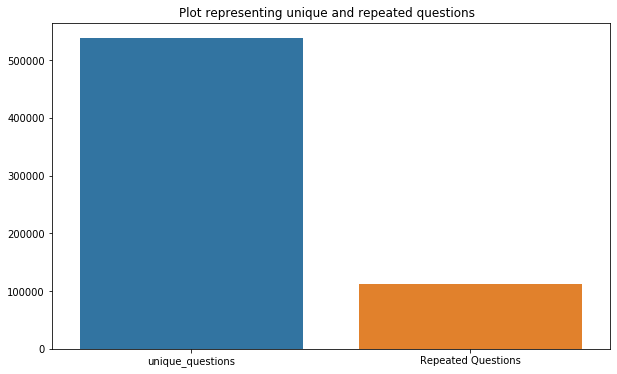

In [10]:
x = ["unique_questions" , "Repeated Questions"]
y =  [unique_qs , qs_morethan_onetime]

plt.figure(figsize=(10, 6))
plt.title ("Plot representing unique and repeated questions  ")
sns.barplot(x,y)
plt.show()

<h3>3.2.3 Checking for Duplicate rows in the dataset

In [11]:
#checking whether there are any repeated pair of questions

pair_duplicates = df[['qid1','qid2','is_duplicate']].groupby(['qid1','qid2']).count().reset_index()

print ("Number of duplicate questions",(pair_duplicates).shape[0] - df.shape[0])

Number of duplicate questions 0


<h3> 3.2.4 Number of occurrences of each question </h3>

Maximum number of times a single question is repeated: 157



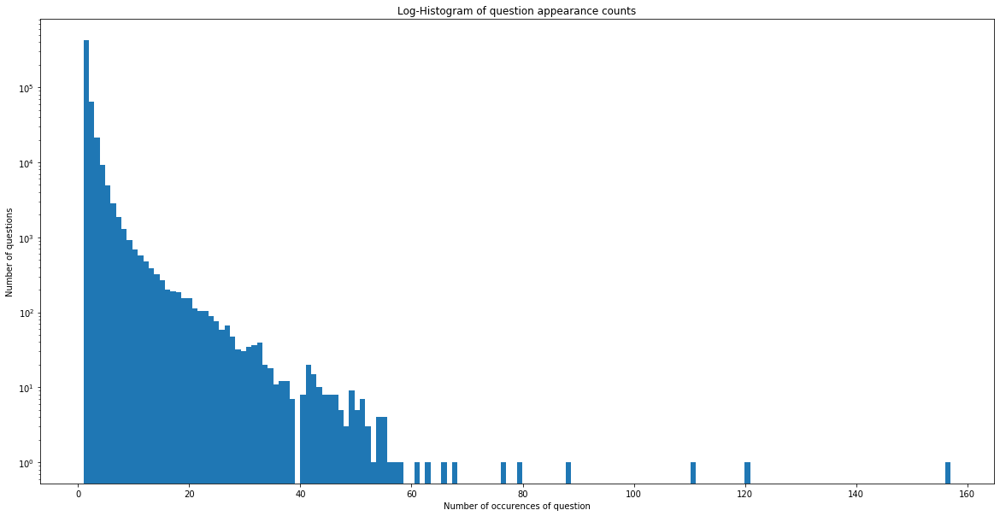

In [12]:
plt.figure(figsize=(20, 10))

plt.hist(qids.value_counts(), bins=160)

plt.yscale('log', nonposy='clip')

plt.title('Log-Histogram of question appearance counts')

plt.xlabel('Number of occurences of question')

plt.ylabel('Number of questions')

print ('Maximum number of times a single question is repeated: {}\n'.format(max(qids.value_counts()))) 

<h3> 3.2.5 Checking for NULL values </h3>

In [13]:
#Checking whether there are any rows with null values
nan_rows = df[df.isnull().any(1)]
print (nan_rows)

            id    qid1    qid2                         question1  \
105780  105780  174363  174364    How can I develop android app?   
201841  201841  303951  174364  How can I create an Android app?   
363362  363362  493340  493341                               NaN   

                                                question2  is_duplicate  
105780                                                NaN             0  
201841                                                NaN             0  
363362  My Chinese name is Haichao Yu. What English na...             0  


- There are two rows with null values in question2 and 1 row null value in question1

In [14]:
# Filling the null values with ' '
df = df.fillna('')
nan_rows = df[df.isnull().any(1)]
print (nan_rows)

Empty DataFrame
Columns: [id, qid1, qid2, question1, question2, is_duplicate]
Index: []


<h2>3.3 Basic Feature Extraction (before cleaning) </h2>

Let us now construct a few features like:
 - ____freq_qid1____ = Frequency of qid1's
 - ____freq_qid2____ = Frequency of qid2's 
 - ____q1len____ = String Length of q1
 - ____q2len____ = String Length of q2
 - ____q1_n_words____ = Number of words in Question 1
 - ____q2_n_words____ = Number of words in Question 2
 - ____word_Common____ = (Number of common unique words in Question 1 and Question 2)
 - ____word_Total____ =(Total num of words in Question 1 + Total num of words in Question 2)
 - ____word_share____ = (word_common)/(word_Total)
 - ____freq_q1+freq_q2____ = sum total of frequency of qid1 and qid2 
 - ____freq_q1-freq_q2____ = absolute difference of frequency of qid1 and qid2 

In [15]:
if os.path.isfile('df_fe_without_preprocessing_train.csv'):
    df = pd.read_csv("df_fe_without_preprocessing_train.csv",encoding='latin-1')
else:
    df['freq_qid1'] = df.groupby('qid1')['qid1'].transform('count') 
    df['freq_qid2'] = df.groupby('qid2')['qid2'].transform('count')
    df['q1len'] = df['question1'].str.len() 
    df['q2len'] = df['question2'].str.len()
    df['q1_n_words'] = df['question1'].apply(lambda row: len(row.split(" ")))
    df['q2_n_words'] = df['question2'].apply(lambda row: len(row.split(" ")))

    def normalized_word_Common(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
        return 1.0 * len(w1 & w2)
    df['word_Common'] = df.apply(normalized_word_Common, axis=1)

    def normalized_word_Total(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
        return 1.0 * (len(w1) + len(w2))
    df['word_Total'] = df.apply(normalized_word_Total, axis=1)

    def normalized_word_share(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
        return 1.0 * len(w1 & w2)/(len(w1) + len(w2))
    df['word_share'] = df.apply(normalized_word_share, axis=1)

    df['freq_q1+q2'] = df['freq_qid1']+df['freq_qid2']
    df['freq_q1-q2'] = abs(df['freq_qid1']-df['freq_qid2'])

    df.to_csv("df_fe_without_preprocessing_train.csv", index=False)

df.head()

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0,1,1,66,57,14,12,10.0,23.0,0.434783,2,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0,4,1,51,88,8,13,4.0,20.0,0.200000,5,3
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0,1,1,73,59,14,10,4.0,24.0,0.166667,2,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0,1,1,50,65,11,9,0.0,19.0,0.000000,2,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0,3,1,76,39,13,7,2.0,20.0,0.100000,4,2


In [16]:
df.shape #11 features have been added

(404290, 17)

<h3> 3.3.1 Analysis of some of the extracted features </h3>

- Here are some questions have only one single words.

In [17]:
print ("Minimum length of the questions in question1 : " , min(df['q1_n_words']))

print ("Minimum length of the questions in question2 : " , min(df['q2_n_words']))

print ("Number of Questions with minimum length [question1] :", df[df['q1_n_words']== 1].shape[0])
print ("Number of Questions with minimum length [question2] :", df[df['q2_n_words']== 1].shape[0])

Minimum length of the questions in question1 :  1
Minimum length of the questions in question2 :  1
Number of Questions with minimum length [question1] : 67
Number of Questions with minimum length [question2] : 24


<h4> 3.3.1.1 Feature: word_share </h4>

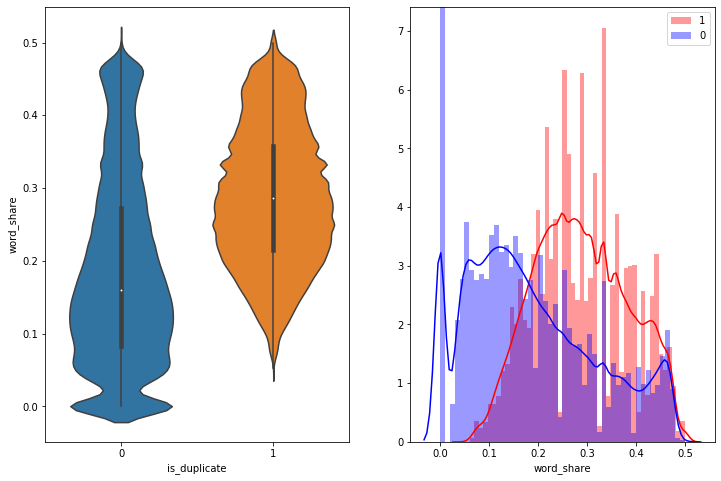

In [18]:
plt.figure(figsize=(12, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'word_share', data = df[0:])

plt.subplot(1,2,2)
sns.distplot(df[df['is_duplicate'] == 1.0]['word_share'][0:] , label = "1", color = 'red')
sns.distplot(df[df['is_duplicate'] == 0.0]['word_share'][0:] , label = "0" , color = 'blue' )
plt.legend()
plt.show()

- From the dist. plot, the distributions for normalized word_share have some overlap on the far right-hand side, i.e., there are quite a lot of questions with high word similarity
- From the box plot, the average word share and Common no. of words of qid1 and qid2 is more when they are duplicate(Similar)

<h4> 3.3.1.2 Feature: word_Common </h4>

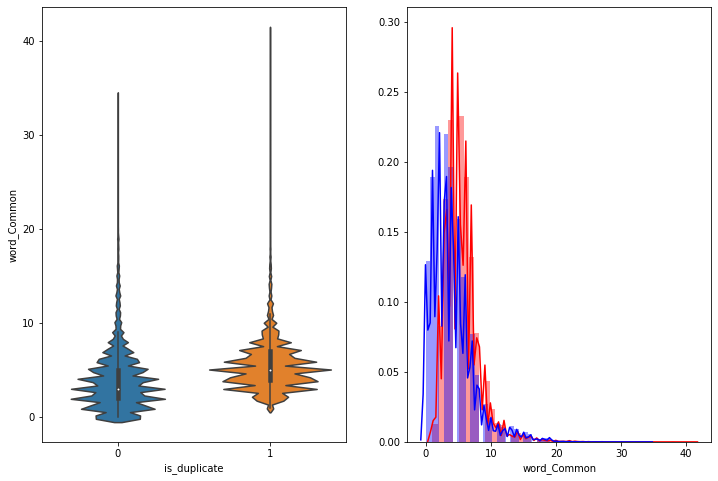

In [19]:
plt.figure(figsize=(12, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'word_Common', data = df[0:])

plt.subplot(1,2,2)
sns.distplot(df[df['is_duplicate'] == 1.0]['word_Common'][0:] , label = "1", color = 'red')
sns.distplot(df[df['is_duplicate'] == 0.0]['word_Common'][0:] , label = "0" , color = 'blue' )
plt.show()

<p> The distributions of the word_Common feature in similar and non-similar questions are highly overlapping </p>

#### 1.2.1 : Importing few modules

In [2]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from subprocess import check_output
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import os
import gc
import re
from nltk.corpus import stopwords
import distance
from nltk.stem import PorterStemmer
from bs4 import BeautifulSoup
import re
from nltk.corpus import stopwords
# This package is used for finding longest common subsequence between two strings
# you can write your own dp code for this
import distance
from nltk.stem import PorterStemmer
from bs4 import BeautifulSoup
from fuzzywuzzy import fuzz
from sklearn.manifold import TSNE
# Import the Required lib packages for WORD-Cloud generation
# https://stackoverflow.com/questions/45625434/how-to-install-wordcloud-in-python3-6
from wordcloud import WordCloud, STOPWORDS
from os import path
from PIL import Image

In [21]:
df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0,1,1,66,57,14,12,10.0,23.0,0.434783,2,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0,4,1,51,88,8,13,4.0,20.0,0.200000,5,3


<h2> 3.4 Preprocessing of Text </h2>

- Preprocessing:
    - Removing html tags 
    - Removing Punctuations
    - Performing stemming
    - Removing Stopwords
    - Expanding contractions etc.

In [23]:
# To get the results in 4 decemal points
SAFE_DIV = 0.0001 

STOP_WORDS = stopwords.words("english")


def preprocess(x):
    x = str(x).lower()
    #Expanding contractions
    x = x.replace(",000,000", "m").replace(",000", "k").replace("′", "'").replace("’", "'")\
                           .replace("won't", "will not").replace("cannot", "can not").replace("can't", "can not")\
                           .replace("n't", " not").replace("what's", "what is").replace("it's", "it is")\
                           .replace("'ve", " have").replace("i'm", "i am").replace("'re", " are")\
                           .replace("he's", "he is").replace("she's", "she is").replace("'s", " own")\
                           .replace("%", " percent ").replace("₹", " rupee ").replace("$", " dollar ")\
                           .replace("€", " euro ").replace("'ll", " will")
    x = re.sub(r"([0-9]+)000000", r"\1m", x)
    x = re.sub(r"([0-9]+)000", r"\1k", x)
    
    
    porter = PorterStemmer()
    pattern = re.compile('\W')
    
    if type(x) == type(''):
        x = re.sub(pattern, ' ', x)
    
    
    if type(x) == type(''):
        x = porter.stem(x)
        example1 = BeautifulSoup(x)
        x = example1.get_text()
               
    
    return x
    

- Function to Compute and get the features : With 2 parameters of Question 1 and Question 2

<h2> 3.5 Advanced Feature Extraction (NLP and Fuzzy Features) </h2>

Definition:
- __Token__: You get a token by splitting sentence a space
- __Stop_Word__ : stop words as per NLTK.
- __Word__ : A token that is not a stop_word


Features:
- __cwc_min__ :  Ratio of common_word_count to min length of word count of Q1 and Q2 <br>cwc_min = common_word_count / (min(len(q1_words), len(q2_words))
<br>
<br>
- __cwc_max__ :  Ratio of common_word_count to max length of word count of Q1 and Q2 <br>cwc_max = common_word_count / (max(len(q1_words), len(q2_words))
<br>
<br>
- __csc_min__ :  Ratio of common_stop_count to min length of stop count of Q1 and Q2 <br> csc_min = common_stop_count / (min(len(q1_stops), len(q2_stops))
<br>
<br>
- __csc_max__ :  Ratio of common_stop_count to max length of stop count of Q1 and Q2<br>csc_max = common_stop_count / (max(len(q1_stops), len(q2_stops))
<br>
<br>
- __ctc_min__ :  Ratio of common_token_count to min length of token count of Q1 and Q2<br>ctc_min = common_token_count / (min(len(q1_tokens), len(q2_tokens))
<br>
<br>

- __ctc_max__ :  Ratio of common_token_count to max length of token count of Q1 and Q2<br>ctc_max = common_token_count / (max(len(q1_tokens), len(q2_tokens))
<br>
<br>
        
- __last_word_eq__ :  Check if Last word of both questions is equal or not<br>last_word_eq = int(q1_tokens[-1] == q2_tokens[-1])
<br>
<br>

- __first_word_eq__ :  Check if First word of both questions is equal or not<br>first_word_eq = int(q1_tokens[0] == q2_tokens[0])
<br>
<br>
        
- __abs_len_diff__ :  Abs. length difference<br>abs_len_diff = abs(len(q1_tokens) - len(q2_tokens))
<br>
<br>

- __mean_len__ :  Average Token Length of both Questions<br>mean_len = (len(q1_tokens) + len(q2_tokens))/2
<br>
<br>


- __fuzz_ratio__ :  https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>

- __fuzz_partial_ratio__ :  https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>


- __token_sort_ratio__ : https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>


- __token_set_ratio__ : https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>





- __longest_substr_ratio__ :  Ratio of length longest common substring to min lenghth of token count of Q1 and Q2<br>longest_substr_ratio = len(longest common substring) / (min(len(q1_tokens), len(q2_tokens))


In [24]:
def get_token_features(q1, q2):
    token_features = [0.0]*10
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()

    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features
    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    token_features[8] = abs(len(q1_tokens) - len(q2_tokens))
    
    #Average Token Length of both Questions
    token_features[9] = (len(q1_tokens) + len(q2_tokens))/2
    return token_features

# get the Longest Common sub string

def get_longest_substr_ratio(a, b):
    strs = list(distance.lcsubstrings(a, b))
    if len(strs) == 0:
        return 0
    else:
        return len(strs[0]) / (min(len(a), len(b)) + 1)

def extract_features(df):
    # preprocessing each question
    df["question1"] = df["question1"].fillna("").apply(preprocess)
    df["question2"] = df["question2"].fillna("").apply(preprocess)

    print("token features...")
    
    # Merging Features with dataset
    
    token_features = df.apply(lambda x: get_token_features(x["question1"], x["question2"]), axis=1)
    
    df["cwc_min"]       = list(map(lambda x: x[0], token_features))
    df["cwc_max"]       = list(map(lambda x: x[1], token_features))
    df["csc_min"]       = list(map(lambda x: x[2], token_features))
    df["csc_max"]       = list(map(lambda x: x[3], token_features))
    df["ctc_min"]       = list(map(lambda x: x[4], token_features))
    df["ctc_max"]       = list(map(lambda x: x[5], token_features))
    df["last_word_eq"]  = list(map(lambda x: x[6], token_features))
    df["first_word_eq"] = list(map(lambda x: x[7], token_features))
    df["abs_len_diff"]  = list(map(lambda x: x[8], token_features))
    df["mean_len"]      = list(map(lambda x: x[9], token_features))
   
    #Computing Fuzzy Features and Merging with Dataset
    
    # do read this blog: http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
    # https://stackoverflow.com/questions/31806695/when-to-use-which-fuzz-function-to-compare-2-strings
    # https://github.com/seatgeek/fuzzywuzzy
    print("fuzzy features..")

    df["token_set_ratio"]       = df.apply(lambda x: fuzz.token_set_ratio(x["question1"], x["question2"]), axis=1)
    # The token sort approach involves tokenizing the string in question, sorting the tokens alphabetically, and 
    # then joining them back into a string We then compare the transformed strings with a simple ratio().
    df["token_sort_ratio"]      = df.apply(lambda x: fuzz.token_sort_ratio(x["question1"], x["question2"]), axis=1)
    df["fuzz_ratio"]            = df.apply(lambda x: fuzz.QRatio(x["question1"], x["question2"]), axis=1)
    df["fuzz_partial_ratio"]    = df.apply(lambda x: fuzz.partial_ratio(x["question1"], x["question2"]), axis=1)
    df["longest_substr_ratio"]  = df.apply(lambda x: get_longest_substr_ratio(x["question1"], x["question2"]), axis=1)
    return df

In [25]:
if os.path.isfile('nlp_features_train.csv'):
    df = pd.read_csv("nlp_features_train.csv",encoding='latin-1')
    df.fillna('')
else:
    print("Extracting features for train:")
    df = pd.read_csv("train.csv")
    df = extract_features(df)
    df.to_csv("nlp_features_train.csv", index=False)
df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,0,1,2,what is the step by step guide to invest in sh...,what is the step by step guide to invest in sh...,0,0.999980,0.833319,0.999983,0.999983,...,0.785709,0.0,1.0,2.0,13.0,100,93,93,100,0.982759
1,1,3,4,what is the story of kohinoor koh i noor dia...,what would happen if the indian government sto...,0,0.799984,0.399996,0.749981,0.599988,...,0.466664,0.0,1.0,5.0,12.5,86,63,66,75,0.596154


In [29]:
df.columns

Index(['id', 'qid1', 'qid2', 'question1', 'question2', 'is_duplicate',
       'cwc_min', 'cwc_max', 'csc_min', 'csc_max', 'ctc_min', 'ctc_max',
       'last_word_eq', 'first_word_eq', 'abs_len_diff', 'mean_len',
       'token_set_ratio', 'token_sort_ratio', 'fuzz_ratio',
       'fuzz_partial_ratio', 'longest_substr_ratio'],
      dtype='object')

In [30]:
df.shape

(404290, 21)

<h3>3.5.1 Analysis of extracted features </h3>

<h4> 3.5.1.1 Plotting Word clouds</h4>

- Creating Word Cloud of Duplicates and Non-Duplicates Question pairs
- We can observe the most frequent occuring words

In [32]:
df_duplicate = df[df['is_duplicate'] == 1]
dfp_nonduplicate = df[df['is_duplicate'] == 0]

# Converting 2d array of q1 and q2 and flatten the array: like {{1,2},{3,4}} to {1,2,3,4}
p = np.dstack([df_duplicate["question1"], df_duplicate["question2"]]).flatten()
n = np.dstack([dfp_nonduplicate["question1"], dfp_nonduplicate["question2"]]).flatten()
#https://stackoverflow.com/questions/25116595/understanding-numpys-dstack-function

print ("Number of data points in class 1 (duplicate pairs) :",len(p))
print ("Number of data points in class 0 (non duplicate pairs) :",len(n))

#Saving the np array into a text file
#np.savetxt('train_p.txt', p, delimiter=' ', fmt='%s')
#np.savetxt('train_n.txt', n, delimiter=' ', fmt='%s')

Number of data points in class 1 (duplicate pairs) : 298526
Number of data points in class 0 (non duplicate pairs) : 510054


In [0]:
# reading the text files and removing the Stop Words:
d = path.dirname('.')

textp_w = open(path.join(d, 'train_p.txt')).read()
textn_w = open(path.join(d, 'train_n.txt')).read()
stopwords = set(STOPWORDS)
stopwords.add("said")
stopwords.add("br")
stopwords.add(" ")
stopwords.remove("not")

stopwords.remove("no")
#stopwords.remove("good")
#stopwords.remove("love")
stopwords.remove("like")
#stopwords.remove("best")
#stopwords.remove("!")
print ("Total number of words in duplicate pair questions :",len(textp_w))
print ("Total number of words in non duplicate pair questions :",len(textn_w))

Total number of words in duplicate pair questions : 16109886
Total number of words in non duplicate pair questions : 33193130


__ Word Clouds generated from  duplicate pair question's text __

Word Cloud for Duplicate Question pairs


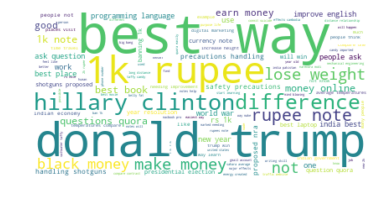

In [0]:
wc = WordCloud(background_color="white", max_words=len(textp_w), stopwords=stopwords)
wc.generate(textp_w)
print ("Word Cloud for Duplicate Question pairs")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

__ Word Clouds generated from non duplicate pair question's text __

Word Cloud for non-Duplicate Question pairs:


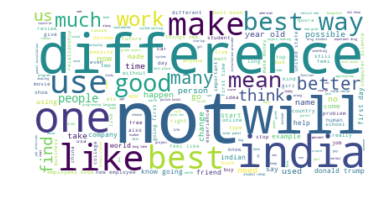

In [0]:
wc = WordCloud(background_color="white", max_words=len(textn_w),stopwords=stopwords)
# generate word cloud
wc.generate(textn_w)
print ("Word Cloud for non-Duplicate Question pairs:")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

<h4> 3.5.1.2 Pair plot of features ['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio'] </h4>

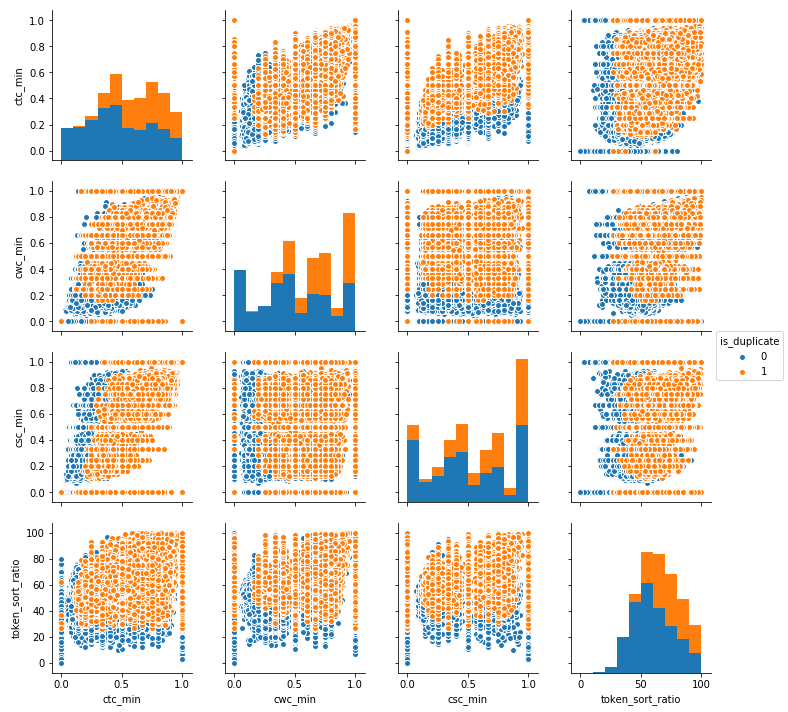

In [0]:
n = df.shape[0]
sns.pairplot(df[['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio', 'is_duplicate']][0:n], hue='is_duplicate', vars=['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio'])
plt.show()

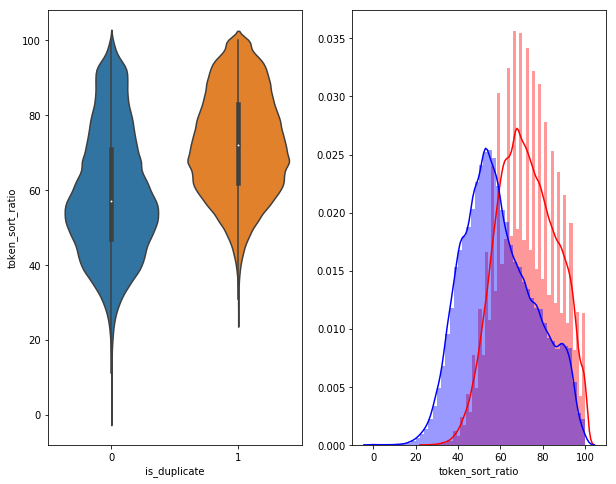

In [0]:
# Distribution of the token_sort_ratio
plt.figure(figsize=(10, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'token_sort_ratio', data = df[0:] , )

plt.subplot(1,2,2)
sns.distplot(df[df['is_duplicate'] == 1.0]['token_sort_ratio'][0:] , label = "1", color = 'red')
sns.distplot(df[df['is_duplicate'] == 0.0]['token_sort_ratio'][0:] , label = "0" , color = 'blue' )
plt.show()

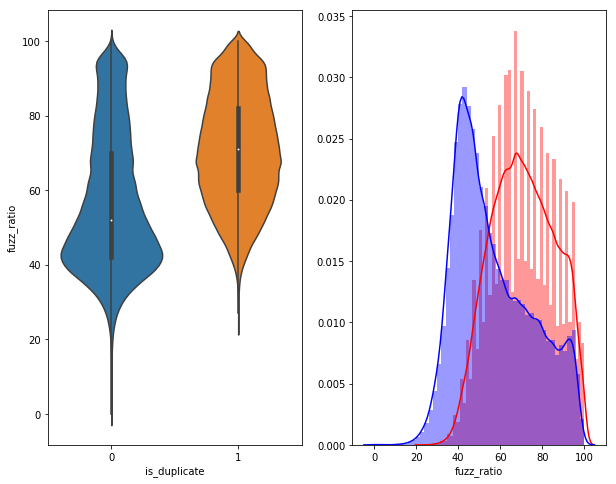

In [0]:
plt.figure(figsize=(10, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'fuzz_ratio', data = df[0:] , )

plt.subplot(1,2,2)
sns.distplot(df[df['is_duplicate'] == 1.0]['fuzz_ratio'][0:] , label = "1", color = 'red')
sns.distplot(df[df['is_duplicate'] == 0.0]['fuzz_ratio'][0:] , label = "0" , color = 'blue' )
plt.show()

<h3>3.5.2 Visualization </h3>

In [0]:
# Using TSNE for Dimentionality reduction for 15 Features(Generated after cleaning the data) to 3 dimention

from sklearn.preprocessing import MinMaxScaler

dfp_subsampled = df[0:5000]
X = MinMaxScaler().fit_transform(dfp_subsampled[['cwc_min', 'cwc_max', 'csc_min', 'csc_max' , 'ctc_min' , 'ctc_max' , 'last_word_eq', 'first_word_eq' , 'abs_len_diff' , 'mean_len' , 'token_set_ratio' , 'token_sort_ratio' ,  'fuzz_ratio' , 'fuzz_partial_ratio' , 'longest_substr_ratio']])
y = dfp_subsampled['is_duplicate'].values

In [0]:
tsne2d = TSNE(
    n_components=2,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.011s...
[t-SNE] Computed neighbors for 5000 samples in 0.912s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.116557
[t-SNE] Computed conditional probabilities in 0.433s
[t-SNE] Iteration 50: error = 80.9244080, gradient norm = 0.0428133 (50 iterations in 13.099s)
[t-SNE] Iteration 100: error = 70.3858795, gradient norm = 0.0100968 (50 iterations in 9.067s)
[t-SNE] Iteration 150: error = 68.6138382, gradient norm = 0.0058392 (50 iterations in 9.602s)
[t-SNE] Iteration 200: error = 67.7700119, gradient norm = 0.0036596 (50 iterations in 9.121s)
[t-SNE] Iteration 250: error = 67.2725067, gradient norm = 0.003496

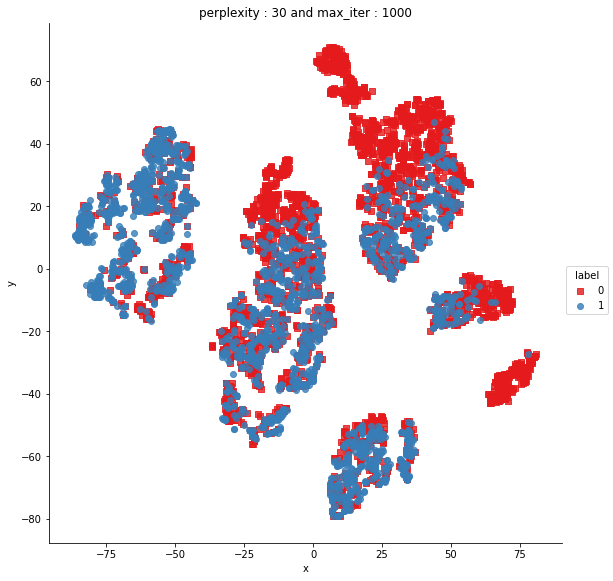

In [0]:
df = pd.DataFrame({'x':tsne2d[:,0], 'y':tsne2d[:,1] ,'label':y})

# draw the plot in appropriate place in the grid
sns.lmplot(data=df, x='x', y='y', hue='label', fit_reg=False, size=8,palette="Set1",markers=['s','o'])
plt.title("perplexity : {} and max_iter : {}".format(30, 1000))
plt.show()

In [0]:
from sklearn.manifold import TSNE
tsne3d = TSNE(
    n_components=3,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.010s...
[t-SNE] Computed neighbors for 5000 samples in 0.935s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.116557
[t-SNE] Computed conditional probabilities in 0.363s
[t-SNE] Iteration 50: error = 77.7944183, gradient norm = 0.1014017 (50 iterations in 34.931s)
[t-SNE] Iteration 100: error = 69.2682266, gradient norm = 0.0248657 (50 iterations in 15.147s)
[t-SNE] Iteration 150: error = 67.7877655, gradient norm = 0.0150941 (50 iterations in 13.761s)
[t-SNE] Iteration 200: error = 67.1991119, gradient norm = 0.0126559 (50 iterations in 13.425s)
[t-SNE] Iteration 250: error = 66.8560715, gradient norm = 0.007

In [0]:
trace1 = go.Scatter3d(
    x=tsne3d[:,0],
    y=tsne3d[:,1],
    z=tsne3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='3d embedding with engineered features')
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble')

<h1> 4. Merging data frames, splitting the data and scaling the numerical extracted features </h1>

### 4.1 Combining dataframes of basic & advanced features

In [3]:
df_basic=pd.read_csv("df_fe_without_preprocessing_train.csv",encoding='latin-1')
df_basic.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0,1,1,66,57,14,12,10.0,23.0,0.434783,2,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0,4,1,51,88,8,13,4.0,20.0,0.200000,5,3


In [4]:
df_basic.columns

Index(['id', 'qid1', 'qid2', 'question1', 'question2', 'is_duplicate',
       'freq_qid1', 'freq_qid2', 'q1len', 'q2len', 'q1_n_words', 'q2_n_words',
       'word_Common', 'word_Total', 'word_share', 'freq_q1+q2', 'freq_q1-q2'],
      dtype='object')

In [5]:
df_advanced=pd.read_csv("nlp_features_train.csv",encoding='latin-1')
df_advanced.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,0,1,2,what is the step by step guide to invest in sh...,what is the step by step guide to invest in sh...,0,0.999980,0.833319,0.999983,0.999983,...,0.785709,0.0,1.0,2.0,13.0,100,93,93,100,0.982759
1,1,3,4,what is the story of kohinoor koh i noor dia...,what would happen if the indian government sto...,0,0.799984,0.399996,0.749981,0.599988,...,0.466664,0.0,1.0,5.0,12.5,86,63,66,75,0.596154


In [6]:
df_advanced.columns

Index(['id', 'qid1', 'qid2', 'question1', 'question2', 'is_duplicate',
       'cwc_min', 'cwc_max', 'csc_min', 'csc_max', 'ctc_min', 'ctc_max',
       'last_word_eq', 'first_word_eq', 'abs_len_diff', 'mean_len',
       'token_set_ratio', 'token_sort_ratio', 'fuzz_ratio',
       'fuzz_partial_ratio', 'longest_substr_ratio'],
      dtype='object')

In [7]:
df1=df_basic.drop(['qid1','qid2','question1','question2','is_duplicate'],axis=1)

In [8]:
df1.head()

,id,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
0,0,1,1,66,57,14,12,10.0,23.0,0.434783,2,0
1,1,4,1,51,88,8,13,4.0,20.0,0.200000,5,3
2,2,1,1,73,59,14,10,4.0,24.0,0.166667,2,0
3,3,1,1,50,65,11,9,0.0,19.0,0.000000,2,0
4,4,3,1,76,39,13,7,2.0,20.0,0.100000,4,2


In [9]:
df1.shape

(404290, 12)

In [10]:
data=df_advanced.merge(df1, on='id',how='left')

In [11]:
data.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,...,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
0,0,1,2,what is the step by step guide to invest in sh...,what is the step by step guide to invest in sh...,0,0.999980,0.833319,0.999983,0.999983,...,1,66,57,14,12,10.0,23.0,0.434783,2,0
1,1,3,4,what is the story of kohinoor koh i noor dia...,what would happen if the indian government sto...,0,0.799984,0.399996,0.749981,0.599988,...,1,51,88,8,13,4.0,20.0,0.200000,5,3


In [12]:
data.shape

(404290, 32)

In [49]:
export_csv = data.to_csv (r'D:\PGS\Applied AI course\E-Notes\Module_6-Real World Case studies\Case Study 1- Quora question Pair Similarity Problem\my_data.csv', index = None, header=True)

In [13]:
data = pd.read_csv('my_data.csv', nrows=100000)
data.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,...,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
0,0,1,2,what is the step by step guide to invest in sh...,what is the step by step guide to invest in sh...,0,0.999980,0.833319,0.999983,0.999983,...,1,66,57,14,12,10.0,23.0,0.434783,2,0
1,1,3,4,what is the story of kohinoor koh i noor dia...,what would happen if the indian government sto...,0,0.799984,0.399996,0.749981,0.599988,...,1,51,88,8,13,4.0,20.0,0.200000,5,3


### 4.2 Splitting the data

In [14]:
Y=data['is_duplicate']
X=data.drop(['qid1','qid2','is_duplicate'],axis=1)
print(X.shape)
print(Y.shape)

(100000, 29)
(100000,)


In [15]:
X.head(2)

,id,question1,question2,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,...,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
0,0,what is the step by step guide to invest in sh...,what is the step by step guide to invest in sh...,0.999980,0.833319,0.999983,0.999983,0.916659,0.785709,0.0,...,1,66,57,14,12,10.0,23.0,0.434783,2,0
1,1,what is the story of kohinoor koh i noor dia...,what would happen if the indian government sto...,0.799984,0.399996,0.749981,0.599988,0.699993,0.466664,0.0,...,1,51,88,8,13,4.0,20.0,0.200000,5,3


In [16]:
# Random train test split( 70:30)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, stratify=Y)

In [17]:
print("Number of data points in train data :",X_train.shape)
print("Number of data points in test data :",X_test.shape)

Number of data points in train data : (70000, 29)
Number of data points in test data : (30000, 29)


In [18]:
print("-"*10, "Distribution of output variable in train data", "-"*10)
train_distr = Counter(y_train)
train_len = len(y_train)
print("Class 0: ",int(train_distr[0])/train_len,"Class 1: ", int(train_distr[1])/train_len)
print("-"*10, "Distribution of output variable in train data", "-"*10)
test_distr = Counter(y_test)
test_len = len(y_test)
print("Class 0: ",int(test_distr[1])/test_len, "Class 1: ",int(test_distr[1])/test_len)

---------- Distribution of output variable in train data ----------
Class 0:  0.6274571428571428 Class 1:  0.3725428571428571
---------- Distribution of output variable in train data ----------
Class 0:  0.3725333333333333 Class 1:  0.3725333333333333


### 4.3 Normalizing extracted features( Basic & Advanced )

### 4.3.1 Advanced features

In [81]:
def scaler(train_column,test_column):
    from sklearn.preprocessing import Normalizer
    normalizer = Normalizer()
    normalizer.fit(train_column.values.reshape(-1,1))

    train_norm = normalizer.transform(train_column.values.reshape(-1,1))
    test_norm = normalizer.transform(test_column.values.reshape(-1,1))
    
    return train_norm,test_norm

In [51]:
X_train_cwc_min_norm,X_test_cwc_min_norm = scaler(X_train['cwc_min'],X_test['cwc_min'])
print("After vectorizations")
print(X_train_cwc_min_norm.shape, y_train.shape)
print(X_test_cwc_min_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(70000, 1) (70000,)
(30000, 1) (30000,)


In [52]:
X_train_cwc_max_norm,X_test_cwc_max_norm = scaler(X_train['cwc_max'],X_test['cwc_max'])

X_train_csc_min_norm,X_test_csc_min_norm = scaler(X_train['csc_min'],X_test['csc_min'])

X_train_csc_max_norm,X_test_csc_max_norm = scaler(X_train['csc_max'],X_test['csc_max'])

X_train_ctc_min_norm,X_test_ctc_min_norm = scaler(X_train['ctc_min'],X_test['ctc_min'])

X_train_ctc_max_norm,X_test_ctc_max_norm = scaler(X_train['ctc_max'],X_test['ctc_max'])

X_train_last_word_eq_norm,X_test_last_word_eq_norm = scaler(X_train['last_word_eq'],X_test['last_word_eq'])

X_train_first_word_eq_norm,X_test_first_word_eq_norm = scaler(X_train['first_word_eq'],X_test['first_word_eq'])

X_train_abs_len_diff_norm,X_test_abs_len_diff_norm = scaler(X_train['abs_len_diff'],X_test['abs_len_diff'])

X_train_mean_len_norm,X_test_mean_len_norm = scaler(X_train['mean_len'],X_test['mean_len'])

X_train_token_set_ratio_norm,X_test_token_set_ratio_norm = scaler(X_train['token_set_ratio'],X_test['token_set_ratio'])

X_train_token_sort_ratio_norm,X_test_token_sort_ratio_norm = scaler(X_train['token_sort_ratio'],X_test['token_sort_ratio'])

X_train_fuzz_ratio_norm,X_test_fuzz_ratio_norm = scaler(X_train['fuzz_ratio'],X_test['fuzz_ratio'])

X_train_fuzz_partial_ratio_norm,X_test_fuzz_partial_ratio_norm = scaler(X_train['fuzz_partial_ratio'],X_test['fuzz_partial_ratio'])

X_train_longest_substr_ratio_norm,X_test_longest_substr_ratio_norm = scaler(X_train['longest_substr_ratio'],X_test['longest_substr_ratio'])


### 4.3.2 Basic features

In [53]:
X_train_freq_qid1_norm,X_test_freq_qid1_norm = scaler(X_train['freq_qid1'],X_test['freq_qid1'])
print("After vectorizations")
print(X_train_freq_qid1_norm.shape, y_train.shape)
print(X_test_freq_qid1_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(70000, 1) (70000,)
(30000, 1) (30000,)


In [54]:
X_train.columns

Index(['id', 'question1', 'question2', 'cwc_min', 'cwc_max', 'csc_min',
       'csc_max', 'ctc_min', 'ctc_max', 'last_word_eq', 'first_word_eq',
       'abs_len_diff', 'mean_len', 'token_set_ratio', 'token_sort_ratio',
       'fuzz_ratio', 'fuzz_partial_ratio', 'longest_substr_ratio', 'freq_qid1',
       'freq_qid2', 'q1len', 'q2len', 'q1_n_words', 'q2_n_words',
       'word_Common', 'word_Total', 'word_share', 'freq_q1+q2', 'freq_q1-q2'],
      dtype='object')

In [55]:
X_train_freq_qid2_norm,X_test_freq_qid2_norm = scaler(X_train['freq_qid2'],X_test['freq_qid2'])

X_train_q1len_norm,X_test_q1len_norm = scaler(X_train['q1len'],X_test['q1len'])

X_train_q2len_norm,X_test_q2len_norm = scaler(X_train['q2len'],X_test['q2len'])

X_train_q1_n_words_norm,X_test_q1_n_words_norm = scaler(X_train['q1_n_words'],X_test['q1_n_words'])

X_train_q2_n_words_norm,X_test_q2_n_words_norm = scaler(X_train['q2_n_words'],X_test['q2_n_words'])

X_train_word_Common_norm,X_test_word_Common_norm = scaler(X_train['word_Common'],X_test['word_Common'])

X_train_word_Total_norm,X_test_word_Total_norm = scaler(X_train['word_Total'],X_test['word_Total'])

X_train_word_share_norm,X_test_word_share_norm = scaler(X_train['word_share'],X_test['word_share'])

X_train_freq_q1addq2_norm,X_test_freq_q1addq2_norm = scaler(X_train['freq_q1+q2'],X_test['freq_q1+q2'])

X_train_freq_q1subq2_norm,X_test_freq_q1subq2_norm = scaler(X_train['freq_q1-q2'],X_test['freq_q1-q2'])

<h1> 5. Featurizing text data using TFIDF & building models </h1>

### 5.1 TFIDF vectorization

#### TFIDF on 'question1' column

In [77]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer1 = TfidfVectorizer(min_df=10,ngram_range=(1,2), max_features=3000)
vectorizer1.fit(X_train['question1'].values.astype('U'))

X_train_q1_tfidf = vectorizer1.transform(X_train['question1'].values.astype('U'))
X_test_q1_tfidf = vectorizer1.transform(X_test['question1'].values.astype('U'))

In [78]:
f1=vectorizer1.get_feature_names()
print("After vectorization")
print(X_train_q1_tfidf.shape, y_train.shape)
print(X_test_q1_tfidf.shape, y_test.shape)
print("="*100)

After vectorization
(70000, 3000) (70000,)
(30000, 3000) (30000,)


#### TFIDF on 'question2' column

In [79]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer2 = TfidfVectorizer(min_df=10,ngram_range=(1,2), max_features=3000)
vectorizer2.fit(X_train['question2'].values.astype('U'))

X_train_q2_tfidf = vectorizer2.transform(X_train['question2'].values.astype('U'))
X_test_q2_tfidf = vectorizer2.transform(X_test['question2'].values.astype('U'))

In [80]:
print("After vectorization")
print(X_train_q2_tfidf.shape, y_train.shape)
print(X_test_q2_tfidf.shape, y_test.shape)
print("="*100)

After vectorization
(70000, 3000) (70000,)
(30000, 3000) (30000,)


### 5.2 Stacking TFIDF+ Basic + Advanced features

In [82]:
#for train data

from scipy.sparse import coo_matrix,hstack

X_tr_tfidf = hstack((X_train_q1_tfidf,X_train_q2_tfidf,X_train_cwc_min_norm,X_train_cwc_max_norm,X_train_csc_min_norm,X_train_csc_max_norm,
                    X_train_ctc_min_norm,X_train_ctc_max_norm,X_train_last_word_eq_norm,X_train_first_word_eq_norm,
                    X_train_abs_len_diff_norm,X_train_mean_len_norm,X_train_token_set_ratio_norm,
                    X_train_token_sort_ratio_norm,X_train_fuzz_ratio_norm,X_train_fuzz_partial_ratio_norm,
                    X_train_longest_substr_ratio_norm,X_train_freq_qid1_norm,X_train_freq_qid2_norm,X_train_q1len_norm,X_train_q2len_norm,
                    X_train_q1_n_words_norm,X_train_q2_n_words_norm,X_train_word_Common_norm,X_train_word_Total_norm,
                    X_train_word_share_norm,X_train_freq_q1addq2_norm,X_train_freq_q1subq2_norm,)).tocsr()


In [83]:
#for test data

X_test_tfidf = hstack((X_test_q1_tfidf,X_test_q2_tfidf,X_test_cwc_min_norm,X_test_cwc_max_norm,X_test_csc_min_norm,X_test_csc_max_norm,
                    X_test_ctc_min_norm,X_test_ctc_max_norm,X_test_last_word_eq_norm,X_test_first_word_eq_norm,
                    X_test_abs_len_diff_norm,X_test_mean_len_norm,X_test_token_set_ratio_norm,
                    X_test_token_sort_ratio_norm,X_test_fuzz_ratio_norm,X_test_fuzz_partial_ratio_norm,
                    X_test_longest_substr_ratio_norm,X_test_freq_qid1_norm,X_test_freq_qid2_norm,X_test_q1len_norm,X_test_q2len_norm,
                    X_test_q1_n_words_norm,X_test_q2_n_words_norm,X_test_word_Common_norm,X_test_word_Total_norm,
                    X_test_word_share_norm,X_test_freq_q1addq2_norm,X_test_freq_q1subq2_norm,)).tocsr()


In [84]:
print("Final Data Matrix")
print(X_tr_tfidf.shape, y_train.shape)
print(X_test_tfidf.shape, y_test.shape)

Final Data Matrix
(70000, 6026) (70000,)
(30000, 6026) (30000,)


In [85]:
# https://stackoverflow.com/questions/8955448/save-load-scipy-sparse-csr-matrix-in-portable-data-format
from scipy import sparse
sparse.save_npz("X_tr_tfidf.npz", X_tr_tfidf)
sparse.save_npz("X_test_tfidf.npz", X_test_tfidf)

In [110]:
#https://www.geeksforgeeks.org/numpy-save/
np.save('y_train', y_train.values)
np.save('y_test', y_test.values)

### 5.3 Confusion matrix, Precision matrix & Recall matrix

In [2]:
# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    # C = [[1, 2],
    #     [3, 4]]
    # C.T = [[1, 3],
    #        [2, 4]]
    # C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =1) = [[3, 7]]
    # ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
    #                           [2/3, 4/7]]

    # ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
    #                           [3/7, 4/7]]
    # sum of row elements = 1
    
    B =(C/C.sum(axis=0))
    #divid each element of the confusion matrix with the sum of elements in that row
    # C = [[1, 2],
    #     [3, 4]]
    # C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =0) = [[4, 6]]
    # (C/C.sum(axis=0)) = [[1/4, 2/6],
    #                      [3/4, 4/6]] 
    plt.figure(figsize=(20,4))
    
    labels = [1,2]
    # representing A in heatmap format
    cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()

### 5.4  Building a random model (Finding worst-case log-loss) 

Log loss on Test Data using Random Model 0.8803563782219028


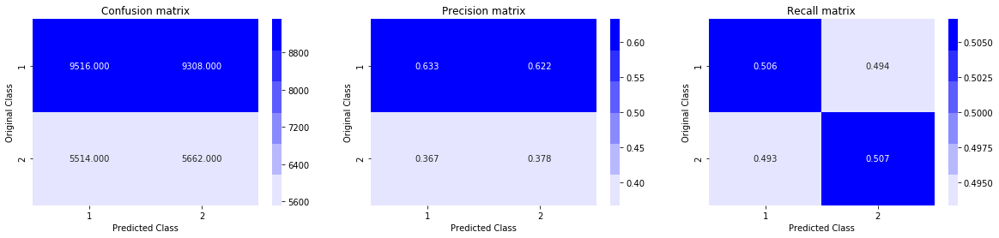

In [88]:
# we need to generate 9 numbers and the sum of numbers should be 1
# one solution is to genarate 9 numbers and divide each of the numbers by their sum
# ref: https://stackoverflow.com/a/18662466/4084039
# we create a output array that has exactly same size as the CV data
from sklearn.metrics.classification import accuracy_score, log_loss

test_len = len(y_test)
predicted_y = np.zeros((test_len,2))
for i in range(test_len):
    rand_probs = np.random.rand(1,2)
    #https://www.geeksforgeeks.org/numpy-random-rand-python/
    predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
print("Log loss on Test Data using Random Model",log_loss(y_test, predicted_y, eps=1e-15))

predicted_y =np.argmax(predicted_y, axis=1)
plot_confusion_matrix(y_test, predicted_y)

### 5.5  Logistic Regression with hyperparameter tuning

For values of alpha =  1e-05 The log loss is: 0.4698712829204895
For values of alpha =  0.0001 The log loss is: 0.47067881405444
For values of alpha =  0.001 The log loss is: 0.5041594558899147
For values of alpha =  0.01 The log loss is: 0.5490340666106179
For values of alpha =  0.1 The log loss is: 0.5664228005052474
For values of alpha =  1 The log loss is: 0.570618098029543
For values of alpha =  10 The log loss is: 0.5700092824996266
For values of alpha =  100 The log loss is: 0.5696951887403758
For values of alpha =  1000 The log loss is: 0.5696694967125947


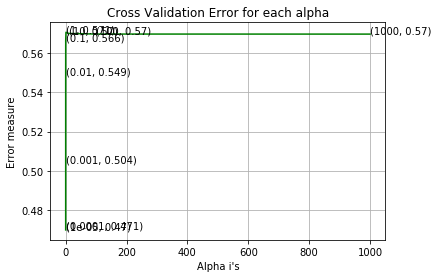

For values of best alpha =  1e-05 The train log loss is: 0.42338034499966004
For values of best alpha =  1e-05 The test log loss is: 0.4698712829204895
Total number of data points : 30000


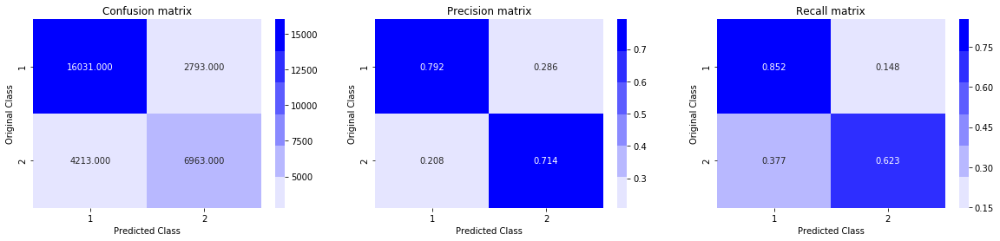

In [89]:
from sklearn.linear_model import SGDClassifier
from sklearn.calibration import CalibratedClassifierCV

alpha = [10 ** x for x in range(-5, 4,)] # hyperparam for SGD classifier.

# read more about SGDClassifier() at http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
# ------------------------------
# default parameters
# SGDClassifier(loss=’hinge’, penalty=’l2’, alpha=0.0001, l1_ratio=0.15, fit_intercept=True, max_iter=None, tol=None, 
# shuffle=True, verbose=0, epsilon=0.1, n_jobs=1, random_state=None, learning_rate=’optimal’, eta0=0.0, power_t=0.5, 
# class_weight=None, warm_start=False, average=False, n_iter=None)

# some of methods
# fit(X, y[, coef_init, intercept_init, …])	Fit linear model with Stochastic Gradient Descent.
# predict(X)	Predict class labels for samples in X.

#-------------------------------
# video link: 
#------------------------------


log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', class_weight='balanced',random_state=42)
    clf.fit(X_tr_tfidf, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_tr_tfidf, y_train)
    predict_y = sig_clf.predict_proba(X_test_tfidf)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', class_weight='balanced', random_state=42)
clf.fit(X_tr_tfidf, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_tr_tfidf, y_train)

predict_y = sig_clf.predict_proba(X_tr_tfidf)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_test_tfidf)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(predict_y,axis=1)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

### 5.6 Linear SVM with hyperparameter tuning

For values of alpha =  1e-05 The log loss is: 0.47642531219758116
For values of alpha =  0.0001 The log loss is: 0.47078579881124905
For values of alpha =  0.001 The log loss is: 0.49698778262848203
For values of alpha =  0.01 The log loss is: 0.5559012949642448
For values of alpha =  0.1 The log loss is: 0.5729869093875302
For values of alpha =  1 The log loss is: 0.5696802321772769
For values of alpha =  10 The log loss is: 0.5696783950237323
For values of alpha =  100 The log loss is: 0.5696786582960095
For values of alpha =  1000 The log loss is: 0.5696786584227757


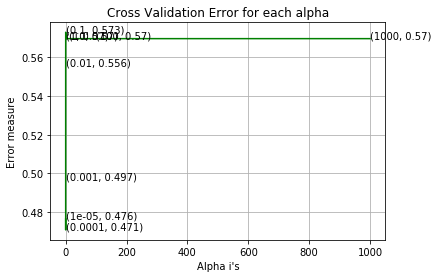

For values of best alpha =  0.0001 The train log loss is: 0.44005538166271924
For values of best alpha =  0.0001 The test log loss is: 0.47078579881124905
Total number of data points : 30000


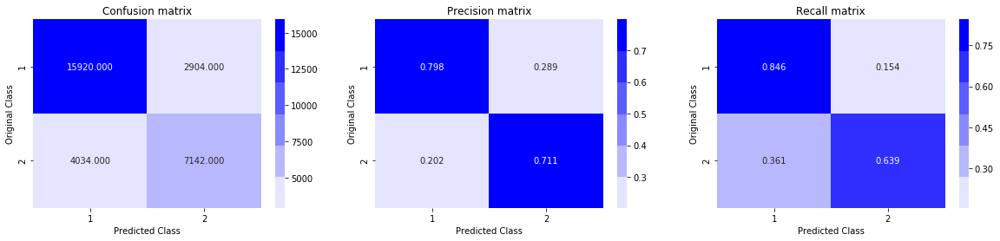

In [90]:
from sklearn.linear_model import SGDClassifier
from sklearn.calibration import CalibratedClassifierCV

alpha = [10 ** x for x in range(-5, 4,)] # hyperparam for SGD classifier.

# read more about SGDClassifier() at http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
# ------------------------------
# default parameters
# SGDClassifier(loss=’hinge’, penalty=’l2’, alpha=0.0001, l1_ratio=0.15, fit_intercept=True, max_iter=None, tol=None, 
# shuffle=True, verbose=0, epsilon=0.1, n_jobs=1, random_state=None, learning_rate=’optimal’, eta0=0.0, power_t=0.5, 
# class_weight=None, warm_start=False, average=False, n_iter=None)

# some of methods
# fit(X, y[, coef_init, intercept_init, …])	Fit linear model with Stochastic Gradient Descent.
# predict(X)	Predict class labels for samples in X.

#-------------------------------
# video link: 
#------------------------------


log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='hinge', class_weight='balanced',random_state=42)
    clf.fit(X_tr_tfidf, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_tr_tfidf, y_train)
    predict_y = sig_clf.predict_proba(X_test_tfidf)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='hinge', class_weight='balanced', random_state=42)
clf.fit(X_tr_tfidf, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_tr_tfidf, y_train)

predict_y = sig_clf.predict_proba(X_tr_tfidf)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_test_tfidf)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(predict_y,axis=1)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

### 5.7 XGBoost with hyperparameter tuning

In [3]:
from scipy import sparse
import numpy as np
X_tr_tfidf= sparse.load_npz("X_tr_tfidf.npz")
X_test_tfidf = sparse.load_npz("X_test_tfidf.npz")
y_train = np.load('y_train.npy')
y_test = np.load('y_test.npy')

In [9]:
#https://dask-ml.readthedocs.io/en/stable/modules/generated/dask_ml.xgboost.XGBClassifier.html
#https://machinelearningmastery.com/develop-first-xgboost-model-python-scikit-learn/

from sklearn.metrics import roc_auc_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import log_loss
from xgboost import XGBClassifier

xgb = XGBClassifier()
parameters = {'n_estimators': [4, 8, 16, 32, 64],'max_depth': [4, 6, 8, 10, 12]}
clf1 = RandomizedSearchCV(xgb, parameters, cv=5, scoring='neg_log_loss',return_train_score=True,n_jobs=-1)
rs1 = clf1.fit(X_tr_tfidf, y_train)

In [10]:
df=pd.DataFrame(clf1.cv_results_)
df.head(2)


,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_max_depth,param_n_estimators,params,rank_test_score,split0_test_score,split0_train_score,...,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,30.175921,0.419009,-0.504676,-0.492908,6,64,"{'max_depth': 6, 'n_estimators': 64}",3,-0.501588,-0.493922,...,-0.506467,-0.492535,-0.505617,-0.492240,-0.505831,-0.492565,0.197680,0.004820,0.001766,0.000611
1,11.561633,0.385943,-0.536407,-0.528430,8,16,"{'max_depth': 8, 'n_estimators': 16}",8,-0.533813,-0.528889,...,-0.538302,-0.528467,-0.536565,-0.528416,-0.537886,-0.527391,0.171997,0.005936,0.001638,0.000566


In [21]:
df.to_csv(r'HYP.csv')

In [3]:
df = pd.read_csv("HYP.csv")

#### 3D-Plot

In [4]:
%matplotlib inline
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

def enable_plotly_in_cell():
    import IPython
    from plotly.offline import init_notebook_mode
    display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
    init_notebook_mode(connected=False)

In [5]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=df['param_n_estimators'],y=df['param_max_depth'],z=df['mean_train_score'], name = 'train')
trace2 = go.Scatter3d(x=df['param_n_estimators'],y=df['param_max_depth'],z=df['mean_test_score'], name = 'Cross validation')
data = [trace1, trace2]
enable_plotly_in_cell()

layout = go.Layout(scene = dict(
        xaxis = dict(title='Estimators'),
        yaxis = dict(title='Max_depth'),
        zaxis = dict(title='Log loss'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

#### Best Hyperparameters

- Considering the overfitting problem,I thereby chose 64 & 6 for estimators & depth respectively

In [13]:
best_parameters = {'n_estimators': [64],'max_depth': [6]}

#### Applying Best Hyperparameters on train & test data & finding the respective log-losses

In [15]:
# find train & test log loss for the best hyperparameters [:,1]

xg_best= XGBClassifier(n_estimators= 64 , max_depth= 6)

xg_best.fit(X_tr_tfidf, y_train)

probs_train= xg_best.predict_proba(X_tr_tfidf)
probs_test= xg_best.predict_proba(X_test_tfidf)

y_pred_train= xg_best.predict(X_tr_tfidf)
y_pred_test= xg_best.predict(X_test_tfidf)

In [17]:
print("The train log loss for the best hyperparameters is:",log_loss(y_train, probs_train, eps=1e-15))
print("The test log loss for the best hyperparameters is:",log_loss(y_test, probs_test, eps=1e-15))

The train log loss for the best hyperparameters is: 0.49418949719297234
The test log loss for the best hyperparameters is: 0.5037430334584166


#### Plot confusion matrix for test data

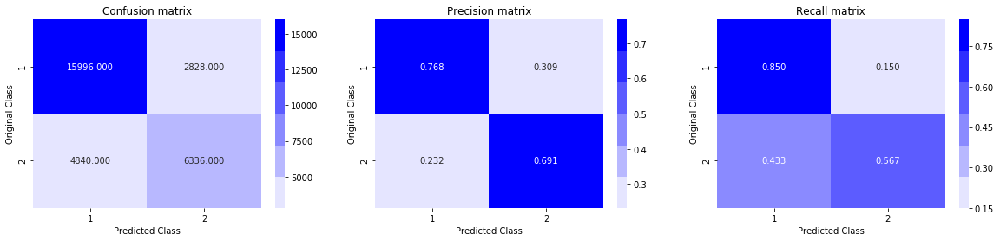

In [18]:
plot_confusion_matrix(y_test, y_pred_test)

<h1> 6. Featurizing text data using TFIDF W2V & building models </h1>

### 6.1 TFIDF W2V on question columns using a pretrained glove model

In [26]:
# pretrained glove model
with open('C:\\Users\\Admin\\Assignments and case studies\\Mandatory\\Assignment 7-SVM on donors choose\\glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())
print ("Done.",len(model)," words loaded!")

Done. 51510  words loaded!


In [29]:
X_train.columns

Index(['id', 'question1', 'question2', 'cwc_min', 'cwc_max', 'csc_min',
       'csc_max', 'ctc_min', 'ctc_max', 'last_word_eq', 'first_word_eq',
       'abs_len_diff', 'mean_len', 'token_set_ratio', 'token_sort_ratio',
       'fuzz_ratio', 'fuzz_partial_ratio', 'longest_substr_ratio', 'freq_qid1',
       'freq_qid2', 'q1len', 'q2len', 'q1_n_words', 'q2_n_words',
       'word_Common', 'word_Total', 'word_share', 'freq_q1+q2', 'freq_q1-q2'],
      dtype='object')

#### Converting the contents to string as there were few float values which were hindering the .split() function

In [38]:
X_train['question1'] = X_train['question1'].apply(lambda x: str(x))
X_train['question2'] = X_train['question2'].apply(lambda x: str(x))

X_test['question1'] = X_test['question1'].apply(lambda x: str(x))
X_test['question2'] = X_test['question2'].apply(lambda x: str(x))

#### TFIDF W2V on 'question1' column

In [35]:
#fitting the tfidf model only on train data to prevent data leakage

tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train['question1'].values.astype('U')) 
#we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words_q1 = set(tfidf_model.get_feature_names())

In [37]:
# For train data

# average Word2Vec using pretrained models
# compute average word2vec for each review.
tfidf_w2v_train_q1 = [] # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['question1']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words_q1):
            vec = model[word]  # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
        tfidf_w2v_train_q1.append(vector)
print(len(tfidf_w2v_train_q1))
print(len(tfidf_w2v_train_q1[0]))

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 70000/70000 [00:07<00:00, 9153.18it/s]


70000
300


In [40]:
# For test data

tfidf_w2v_test_q1 = [] # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['question1']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words_q1):
            vec = model[word]  # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
        tfidf_w2v_test_q1.append(vector)
print(len(tfidf_w2v_test_q1))
print(len(tfidf_w2v_test_q1[0]))

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30000/30000 [00:03<00:00, 8870.33it/s]


30000
300


#### TFIDF W2V on 'question2' column

In [42]:
#fitting the tfidf model only on train data to prevent data leakage

tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train['question2'].values.astype('U')) 
#we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words_q2 = set(tfidf_model.get_feature_names())

In [49]:
# For train data

# average Word2Vec using pretrained models
# compute average word2vec for each review.
tfidf_w2v_train_q2 = [] # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['question2']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words_q2):
            vec = model[word]  # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
        tfidf_w2v_train_q2.append(vector)
print(len(tfidf_w2v_train_q2))
print(len(tfidf_w2v_train_q2[0]))

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 70000/70000 [00:07<00:00, 8905.04it/s]


70000
300


In [47]:
# For test data

tfidf_w2v_test_q2 = [] # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['question2']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words_q2):
            vec = model[word]  # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
        tfidf_w2v_test_q2.append(vector)
print(len(tfidf_w2v_test_q2))
print(len(tfidf_w2v_test_q2[0]))

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30000/30000 [00:03<00:00, 8949.67it/s]


30000
300


### 6.2 Stacking TFIDF W2V+ Basic + Advanced features

In [64]:
#for train data

from scipy.sparse import coo_matrix,hstack

X_tr_tfidf_w2v = hstack((tfidf_w2v_train_q1,tfidf_w2v_train_q2,coo_matrix(X_train_cwc_min_norm),coo_matrix(X_train_cwc_max_norm),coo_matrix(X_train_csc_min_norm),coo_matrix(X_train_csc_max_norm),
                    coo_matrix(X_train_ctc_min_norm),coo_matrix(X_train_ctc_max_norm),coo_matrix(X_train_last_word_eq_norm),coo_matrix(X_train_first_word_eq_norm),
                    coo_matrix(X_train_abs_len_diff_norm),coo_matrix(X_train_mean_len_norm),coo_matrix(X_train_token_set_ratio_norm),
                    coo_matrix(X_train_token_sort_ratio_norm),coo_matrix(X_train_fuzz_ratio_norm),coo_matrix(X_train_fuzz_partial_ratio_norm),
                    coo_matrix(X_train_longest_substr_ratio_norm),coo_matrix(X_train_freq_qid1_norm),coo_matrix(X_train_freq_qid2_norm),coo_matrix(X_train_q1len_norm),coo_matrix(X_train_q2len_norm),
                    coo_matrix(X_train_q1_n_words_norm),coo_matrix(X_train_q2_n_words_norm),coo_matrix(X_train_word_Common_norm),coo_matrix(X_train_word_Total_norm),
                    coo_matrix(X_train_word_share_norm),coo_matrix(X_train_freq_q1addq2_norm),coo_matrix(X_train_freq_q1subq2_norm))).tocsr()


In [74]:
#for test data

X_test_tfidf_w2v = hstack((tfidf_w2v_test_q1,tfidf_w2v_test_q2,coo_matrix(X_test_cwc_min_norm),coo_matrix(X_test_cwc_max_norm),coo_matrix(X_test_csc_min_norm),coo_matrix(X_test_csc_max_norm),
                    coo_matrix(X_test_ctc_min_norm),coo_matrix(X_test_ctc_max_norm),coo_matrix(X_test_last_word_eq_norm),coo_matrix(X_test_first_word_eq_norm),
                    coo_matrix(X_test_abs_len_diff_norm),coo_matrix(X_test_mean_len_norm),coo_matrix(X_test_token_set_ratio_norm),
                    coo_matrix(X_test_token_sort_ratio_norm),coo_matrix(X_test_fuzz_ratio_norm),coo_matrix(X_test_fuzz_partial_ratio_norm),
                    coo_matrix(X_test_longest_substr_ratio_norm),coo_matrix(X_test_freq_qid1_norm),coo_matrix(X_test_freq_qid2_norm),coo_matrix(X_test_q1len_norm),coo_matrix(X_test_q2len_norm),
                    coo_matrix(X_test_q1_n_words_norm),coo_matrix(X_test_q2_n_words_norm),coo_matrix(X_test_word_Common_norm),coo_matrix(X_test_word_Total_norm),
                    coo_matrix(X_test_word_share_norm),coo_matrix(X_test_freq_q1addq2_norm),coo_matrix(X_test_freq_q1subq2_norm))).tocsr()


In [75]:
print("Final Data Matrix")
print(X_tr_tfidf_w2v.shape, y_train.shape)
print(X_test_tfidf_w2v.shape, y_test.shape)

Final Data Matrix
(70000, 626) (70000,)
(30000, 626) (30000,)


In [76]:
# https://stackoverflow.com/questions/8955448/save-load-scipy-sparse-csr-matrix-in-portable-data-format
from scipy import sparse
sparse.save_npz("X_tr_tfidf_w2v.npz", X_tr_tfidf_w2v)
sparse.save_npz("X_test_tfidf_w2v.npz", X_test_tfidf_w2v)

### 6.3 Confusion matrix, Precision matrix & Recall matrix

In [91]:
# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    # C = [[1, 2],
    #     [3, 4]]
    # C.T = [[1, 3],
    #        [2, 4]]
    # C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =1) = [[3, 7]]
    # ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
    #                           [2/3, 4/7]]

    # ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
    #                           [3/7, 4/7]]
    # sum of row elements = 1
    
    B =(C/C.sum(axis=0))
    #divid each element of the confusion matrix with the sum of elements in that row
    # C = [[1, 2],
    #     [3, 4]]
    # C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =0) = [[4, 6]]
    # (C/C.sum(axis=0)) = [[1/4, 2/6],
    #                      [3/4, 4/6]] 
    plt.figure(figsize=(20,4))
    
    labels = [1,2]
    # representing A in heatmap format
    cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()

### 6.4 Building a random model (Finding worst-case log-loss) 

Log loss on Test Data using Random Model 0.8803385092512034


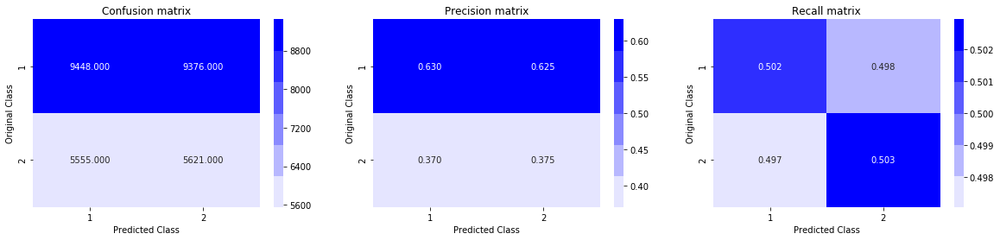

In [92]:
# we need to generate 9 numbers and the sum of numbers should be 1
# one solution is to genarate 9 numbers and divide each of the numbers by their sum
# ref: https://stackoverflow.com/a/18662466/4084039
# we create a output array that has exactly same size as the CV data
from sklearn.metrics.classification import accuracy_score, log_loss

test_len = len(y_test)
predicted_y = np.zeros((test_len,2))
for i in range(test_len):
    rand_probs = np.random.rand(1,2)
    #https://www.geeksforgeeks.org/numpy-random-rand-python/
    predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
print("Log loss on Test Data using Random Model",log_loss(y_test, predicted_y, eps=1e-15))

predicted_y =np.argmax(predicted_y, axis=1)
plot_confusion_matrix(y_test, predicted_y)

### 6.5 Logistic Regression with hyperparameter tuning

For values of alpha =  1e-05 The log loss is: 0.556740965244953
For values of alpha =  0.0001 The log loss is: 0.5571572922078711
For values of alpha =  0.001 The log loss is: 0.5582202579968012
For values of alpha =  0.01 The log loss is: 0.5636722936390104
For values of alpha =  0.1 The log loss is: 0.5707787427730561
For values of alpha =  1 The log loss is: 0.5734408788711123
For values of alpha =  10 The log loss is: 0.5724647932457096
For values of alpha =  100 The log loss is: 0.5720238972493338
For values of alpha =  1000 The log loss is: 0.5719832437714961


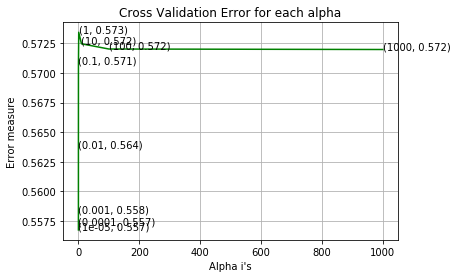

For values of best alpha =  1e-05 The train log loss is: 0.5551586259844465
For values of best alpha =  1e-05 The test log loss is: 0.556740965244953
Total number of data points : 30000


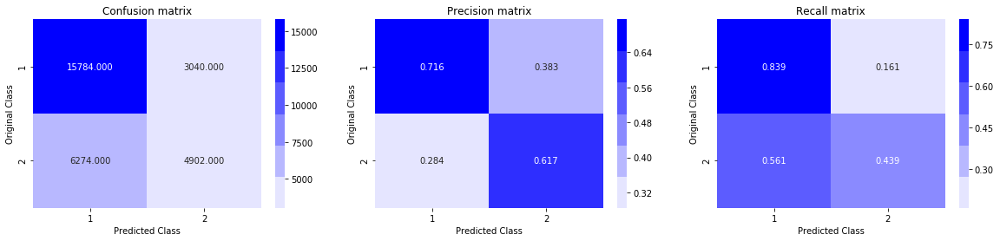

In [93]:
from sklearn.linear_model import SGDClassifier
from sklearn.calibration import CalibratedClassifierCV

alpha = [10 ** x for x in range(-5, 4,)] # hyperparam for SGD classifier.

# read more about SGDClassifier() at http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
# ------------------------------
# default parameters
# SGDClassifier(loss=’hinge’, penalty=’l2’, alpha=0.0001, l1_ratio=0.15, fit_intercept=True, max_iter=None, tol=None, 
# shuffle=True, verbose=0, epsilon=0.1, n_jobs=1, random_state=None, learning_rate=’optimal’, eta0=0.0, power_t=0.5, 
# class_weight=None, warm_start=False, average=False, n_iter=None)

# some of methods
# fit(X, y[, coef_init, intercept_init, …])	Fit linear model with Stochastic Gradient Descent.
# predict(X)	Predict class labels for samples in X.

#-------------------------------
# video link: 
#------------------------------


log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', class_weight='balanced',random_state=42)
    clf.fit(X_tr_tfidf_w2v, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_tr_tfidf_w2v, y_train)
    predict_y = sig_clf.predict_proba(X_test_tfidf_w2v)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', class_weight='balanced', random_state=42)
clf.fit(X_tr_tfidf_w2v, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_tr_tfidf_w2v, y_train)

predict_y = sig_clf.predict_proba(X_tr_tfidf_w2v)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_test_tfidf_w2v)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(predict_y,axis=1)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

### 6.6 Linear SVM with hyperparameter tuning

For values of alpha =  1e-05 The log loss is: 0.5602739178758853
For values of alpha =  0.0001 The log loss is: 0.5621231013295959
For values of alpha =  0.001 The log loss is: 0.5644898883770046
For values of alpha =  0.01 The log loss is: 0.5761936770265136
For values of alpha =  0.1 The log loss is: 0.5774482999030066
For values of alpha =  1 The log loss is: 0.572000857193398
For values of alpha =  10 The log loss is: 0.5719951831016798
For values of alpha =  100 The log loss is: 0.571995521788538
For values of alpha =  1000 The log loss is: 0.5719955218377696


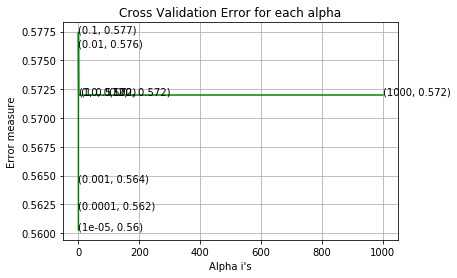

For values of best alpha =  1e-05 The train log loss is: 0.558917466542778
For values of best alpha =  1e-05 The test log loss is: 0.5602739178758853
Total number of data points : 30000


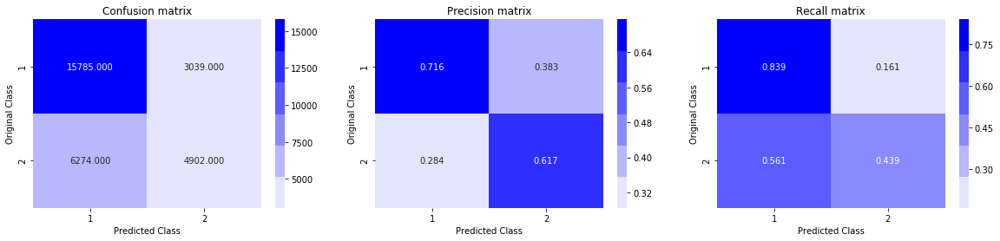

In [94]:
from sklearn.linear_model import SGDClassifier
from sklearn.calibration import CalibratedClassifierCV

alpha = [10 ** x for x in range(-5, 4,)] # hyperparam for SGD classifier.

# read more about SGDClassifier() at http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
# ------------------------------
# default parameters
# SGDClassifier(loss=’hinge’, penalty=’l2’, alpha=0.0001, l1_ratio=0.15, fit_intercept=True, max_iter=None, tol=None, 
# shuffle=True, verbose=0, epsilon=0.1, n_jobs=1, random_state=None, learning_rate=’optimal’, eta0=0.0, power_t=0.5, 
# class_weight=None, warm_start=False, average=False, n_iter=None)

# some of methods
# fit(X, y[, coef_init, intercept_init, …])	Fit linear model with Stochastic Gradient Descent.
# predict(X)	Predict class labels for samples in X.

#-------------------------------
# video link: 
#------------------------------


log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='hinge', class_weight='balanced',random_state=42)
    clf.fit(X_tr_tfidf_w2v, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_tr_tfidf_w2v, y_train)
    predict_y = sig_clf.predict_proba(X_test_tfidf_w2v)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='hinge', class_weight='balanced', random_state=42)
clf.fit(X_tr_tfidf_w2v, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_tr_tfidf_w2v, y_train)

predict_y = sig_clf.predict_proba(X_tr_tfidf_w2v)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_test_tfidf_w2v)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(predict_y,axis=1)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

### 6.7 XGBoost with hyperparameter tuning

In [5]:
from scipy import sparse
import numpy as np
X_tr_tfidf_w2v= sparse.load_npz("X_tr_tfidf_w2v.npz")
X_test_tfidf_w2v = sparse.load_npz("X_test_tfidf_w2v.npz")
y_train = np.load('y_train.npy')
y_test = np.load('y_test.npy')

In [6]:
#https://dask-ml.readthedocs.io/en/stable/modules/generated/dask_ml.xgboost.XGBClassifier.html
#https://machinelearningmastery.com/develop-first-xgboost-model-python-scikit-learn/

from sklearn.metrics import roc_auc_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import log_loss
from xgboost import XGBClassifier

xgb = XGBClassifier()
parameters = {'n_estimators': [4, 8, 16, 32, 64],'max_depth': [4, 6, 8, 10, 12]}
clf1 = RandomizedSearchCV(xgb, parameters, cv=5, scoring='neg_log_loss',return_train_score=True,n_jobs=-1)
rs1 = clf1.fit(X_tr_tfidf_w2v, y_train)

In [7]:
df=pd.DataFrame(clf1.cv_results_)
df.head(2)

,mean_fit_time,mean_score_time,mean_test_score,mean_train_score,param_max_depth,param_n_estimators,params,rank_test_score,split0_test_score,split0_train_score,...,split2_test_score,split2_train_score,split3_test_score,split3_train_score,split4_test_score,split4_train_score,std_fit_time,std_score_time,std_test_score,std_train_score
0,169.665524,6.358930,-0.668843,-0.657575,6,8,"{'n_estimators': 8, 'max_depth': 6}",6,-0.676163,-0.657868,...,-0.666778,-0.657529,-0.666881,-0.657187,-0.667315,-0.658132,0.378556,0.098426,0.003664,0.000379
1,169.564930,6.229914,-0.679065,-0.627150,12,4,"{'n_estimators': 4, 'max_depth': 12}",10,-0.691121,-0.633360,...,-0.675462,-0.634256,-0.675938,-0.617215,-0.676269,-0.631411,4.670757,0.140941,0.006039,0.007271


In [8]:
df.to_csv(r'HYP_w2v.csv')

In [6]:
df = pd.read_csv("HYP_w2v.csv")

#### 3D-Plot

In [7]:
%matplotlib inline
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

def enable_plotly_in_cell():
    import IPython
    from plotly.offline import init_notebook_mode
    display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
    init_notebook_mode(connected=False)

In [8]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=df['param_n_estimators'],y=df['param_max_depth'],z=df['mean_train_score'], name = 'train')
trace2 = go.Scatter3d(x=df['param_n_estimators'],y=df['param_max_depth'],z=df['mean_test_score'], name = 'Cross validation')
data = [trace1, trace2]
enable_plotly_in_cell()

layout = go.Layout(scene = dict(
        xaxis = dict(title='Estimators'),
        yaxis = dict(title='Max_depth'),
        zaxis = dict(title='Log-loss'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

#### Best Hyperparameters

In [14]:
print(clf1.best_estimator_)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=None, n_estimators=32, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)


In [15]:
best_parameters = {'n_estimators': [32],'max_depth': [4]}

#### Applying Best Hyperparameters on train & test data & finding the respective log-losses

In [18]:
import xgboost as xgb
params = {}
params['objective'] = 'binary:logistic'
params['eval_metric'] = 'logloss'
params['eta'] = 0.02
params['max_depth'] = 4
params['n_estimators'] = 32

d_train = xgb.DMatrix(X_tr_tfidf_w2v, label=y_train)
d_test = xgb.DMatrix(X_test_tfidf_w2v, label=y_test)

watchlist = [(d_train, 'train'), (d_test, 'valid')]

bst = xgb.train(params, d_train, 400, watchlist, early_stopping_rounds=20, verbose_eval=10)

xgdmat = xgb.DMatrix(X_tr_tfidf_w2v,y_train)
predict_y = bst.predict(d_test)
print("The test log loss is:",log_loss(y_test, predict_y,eps=1e-15))

[0]	train-logloss:0.691728	valid-logloss:0.6919
Multiple eval metrics have been passed: 'valid-logloss' will be used for early stopping.

Will train until valid-logloss hasn't improved in 20 rounds.
[10]	train-logloss:0.680798	valid-logloss:0.68133
[20]	train-logloss:0.673284	valid-logloss:0.674332
[30]	train-logloss:0.668022	valid-logloss:0.669642
[40]	train-logloss:0.66429	valid-logloss:0.666535
[50]	train-logloss:0.661577	valid-logloss:0.664499
[60]	train-logloss:0.659595	valid-logloss:0.663141
[70]	train-logloss:0.658116	valid-logloss:0.662289
[80]	train-logloss:0.656938	valid-logloss:0.661719
[90]	train-logloss:0.65596	valid-logloss:0.661333
[100]	train-logloss:0.655137	valid-logloss:0.66113
[110]	train-logloss:0.65442	valid-logloss:0.661017
[120]	train-logloss:0.653761	valid-logloss:0.660955
[130]	train-logloss:0.653114	valid-logloss:0.660891
[140]	train-logloss:0.652487	valid-logloss:0.660895
[150]	train-logloss:0.651918	valid-logloss:0.660935
Stopping. Best iteration:
[137]	tra

#### Plot confusion matrix for test data

Total number of data points : 30000


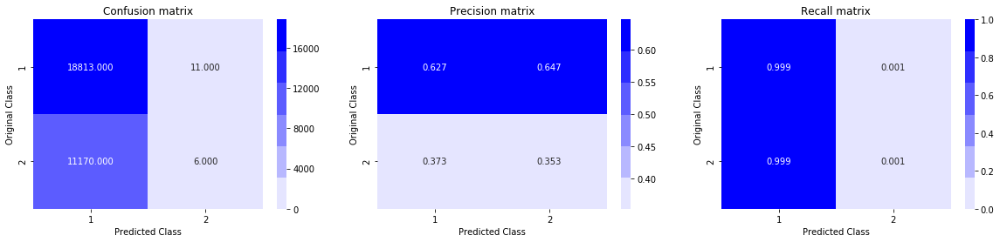

In [20]:
predicted_y =np.array(predict_y>0.5,dtype=int)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

## 7. Summary of model performances

In [25]:
#Ref: http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
    
x = PrettyTable()

x.field_names = ["Vectorizer","Models","Test Log-loss"]
x.add_row(["TFIDF", "Random model", 0.884])
x.add_row(["TFIDF", "Logistic regression", 0.470])
x.add_row(["TFIDF", "Linear SVM", 0.471])
x.add_row(["TFIDF", "XGBoost", 0.504])
                 
x.add_row(["--------", "------------------", "------------------"])                

x.add_row(["TFIDF W2V", "Random model", 0.884])
x.add_row(["TFIDF W2V", "Logistic regression", 0.557])
x.add_row(["TFIDF W2V", "Linear SVM", 0.560])
x.add_row(["TFIDF W2V", "XGBoost", 0.661])
print(x)

+------------+---------------------+--------------------+
| Vectorizer |        Models       |   Test Log-loss    |
+------------+---------------------+--------------------+
|   TFIDF    |     Random model    |       0.884        |
|   TFIDF    | Logistic regression |        0.47        |
|   TFIDF    |      Linear SVM     |       0.471        |
|   TFIDF    |       XGBoost       |       0.504        |
|  --------  |  ------------------ | ------------------ |
| TFIDF W2V  |     Random model    |       0.884        |
| TFIDF W2V  | Logistic regression |       0.557        |
| TFIDF W2V  |      Linear SVM     |        0.56        |
| TFIDF W2V  |       XGBoost       |       0.661        |
+------------+---------------------+--------------------+


## 8. Conclusion

- From the above table it can be observed that when text data was vectorized using simple TFIDF, linear models (Logistic regression in specific) performed well compared to linear models built on TFIDF W2V. The reason is high dimensionality of the features using TFIDF
- XGBoost could have performed well on TFIDF W2V if more hyperparameters could have been tuned. I just considered max_depth & n_estimators

### Procedure followed to solve this case study:

1. The real problem was mapped to a ML problem as a binary classification task where label 1 indicated the question pair was duplicate & 0 indicated thhat the question pair is different from each other.
2. EDA on the data was done where important aspects like output class distribution,total number of Unique Questions, # of unique questions that appear more than once, max number of times a single question was repeated, checking for duplicate question pair,Checking for NULL values in the data & plotting the # of occurances of each question.
3. 11 basic features were constructed using question id's & the question pairs text. word_share & word_common were the features that were analysed in detail using violin plots & pdf in order to determine if they could make an impact in predicting the class labels.
4. 15 advanced nlp features were constructed and then the question pairs were preprocessed to remove html tags, punctuations & stopwords. 
5. After preprocessing word clouds for both the class labels were created in order to observe the most frequently occuring words in both the classes
6. token_sort_ratio & fuzz_ratio were analysed using violin plots & pdfs'.
7. All 15 advanced nlp features were visualized using TSNE.
8. Referring to Assignment section-5, the next step was to merge the dataframes of basic & advanced features into a single data frame & then split the data into train & test.
9. Post data split, the text data was vectorized using TFIDF with max features of 3000.
10. Next, all numerical features that included basic & advanced features were scaled using normalization.
11. Once the preprocessing was done, next was to concatenate all features which were in the form of a 2D array using hstack function. In sum, there were 6026 features after concatenation.
12. A random model was built by assigning random probabilities for both the classes using inbuilt random # generator. Log loss was calculated & it was set as a benchmark for other models to perform better. The confusion matrix for test data was plotted in the end.
13. A simple hyperparameter tuned LR model was built and the train,test log loss was observed using the best value of alpha.
14. A linear SVM model was built and hyperparameter tuning was done using simple for loops. Once the best value of alpha was found,the train & test log loss was observed & the confusion matrix was plotted .
15. Finally a hyperparameter tuned XGBoost model was built using n_estimators & max_depth as hyperparameters. Used a 3D plot to determine the best n_estimators & max_depth. The train & test log loss was calculated and the confusion matrix was plotted to observe the FP,TP,FN & TN.
16. Results were tabulated to compare the performance of models.